In [1]:
import os
import sys
import json
import numpy as np
import matplotlib.pyplot as plt

sys.path.insert(0, '../codes/')
import bulkMotion
import misc


font_size=26
plt.rcParams.update({'font.size': font_size})

# Read all the paths from the json file

The velocity files, DEM files, and the geoemtry files are all stored on `marmot-nobak`. These paths are stored in `datasets.json`.

We will:

1. Read the paths from the json file into a dictioanry for future use.
2. Make a backup of the json file

In [4]:
## Build a dictionary to save all the LOSgeom class obj from different datasets (tracks)
all_class = dict()


## Read pre-defined paths
my_json = '../inputs/datasets.json'
with open(my_json) as file:
    pathDict = json.load(file)
    
    
## Save pre-defined paths to a back-up
with open('../inputs/datasets_bak.json'.format(my_json.split('.')[0]), 'w') as file:
    json_string = json.dumps(pathDict, default=lambda o: o.__dict__, sort_keys=True, indent=2)
    file.write(json_string)

# Plate motion model correction on the dataset

## Dataset: Aqaba ascending track 087

+ Processing: already with ERA5, SET, ionosphere, demErr corrections applied

+ Make sure to use the plate motion model from papers, replace the `pmm` variable to reflect the plate motion model name

+ Use the corresponding plate name to plot the plate boundary geoemtry and arrows on it



----- 0.00 seconds ----- start timing

Analyze the data from:  Aqaba a087
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/ykliu/aqaba/topsStack/a087/mintpy_new/inputs/geometryGeo.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Arabia

Cartesian rotation vector:
 wx:            1.1540 mas / yr
 wy:            -0.1360 mas / yr
 wz:            1.4440 mas / yr

Euler pole representation:
 Latitude:      51.1764 deg
 Longitude:     353.2786 deg
 Rotation rate: 0.5149 deg / Ma  

2D array locations

----- 12.39 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.08 seconds ----- got the model LOS velocity grid

No reference point, remove a median from each dataset!!
Reference data: <LOS velocity (no iono corr)>  	 shifted by 0.48261377215385437
Reference data: <LOS velocity (iono corr)>     	 shifted by 0

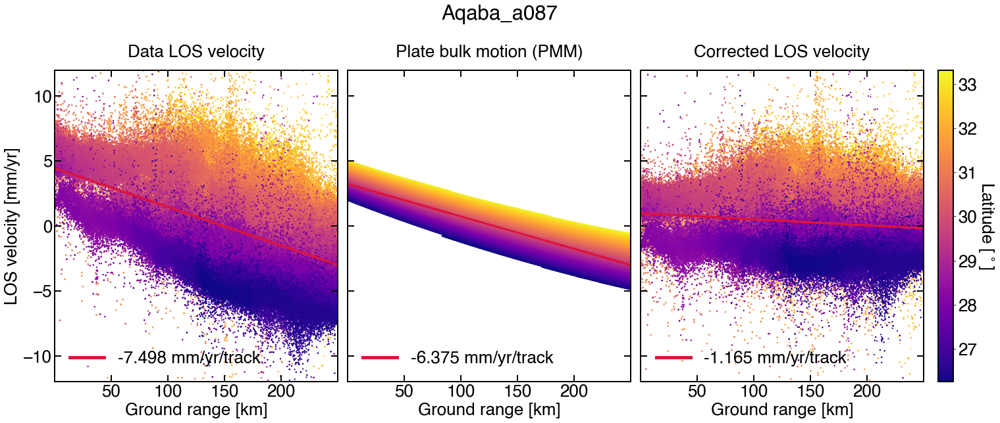


----- 71.08 seconds ----- plotted range ramps

only show one common colorbar in the first subplot
Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/ykliu/aqaba/topsStack/a087/mintpy_new/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -8 8 --mask no --dem /marmot-nobak/ykliu/aqaba/broad_dem_new/dem_resamp_a087/a087.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot data no. 2: <LOS Plate bulk motion>
view.py /marmot-nobak/ykliu/aqaba/topsStack/a087/mintpy_new/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -8 8 --mask no --dem /marmot-nobak/ykliu/aqaba/broad_dem_new/dem_resamp_a087/a087.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreferenc

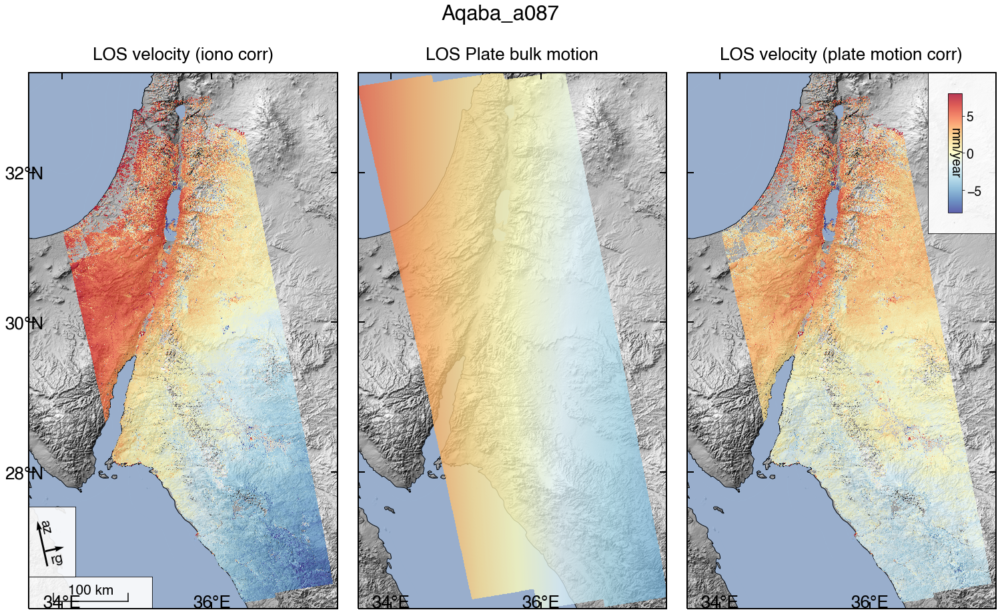


----- 11.46 seconds ----- plotted pmm correction


----- 0.12 seconds ----- saved .h5 files


===== 96.08 seconds ===== total time elapsed



In [5]:
omega_cart = [1.154, -0.136, 1.444]

dName = 'Aqaba a087'
pName = 'Arabia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 14,
            'plot_pmm'     : False,
            'plot_ins'     : False,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,          
            'vlim_i'       : [[-10,10],[-10,10],[-2,2]],
            'vlim_r'       : [-12,12],
            'vlim_b'       : [-8,8],
            'refpoint'     : False,
            'shadeExg'     : 0.07,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdYlBu_r',
            'dpi'          : 100,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Aqaba a087_new
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/ykliu/aqaba/topsStack/a087/mintpy/inputs/geometryGeo.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Arabia

Cartesian rotation vector:
 wx:            1.1540 mas / yr
 wy:            -0.1360 mas / yr
 wz:            1.4440 mas / yr

Euler pole representation:
 Latitude:      51.1764 deg
 Longitude:     353.2786 deg
 Rotation rate: 0.5149 deg / Ma  

2D array locations

----- 11.94 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.06 seconds ----- got the model LOS velocity grid

No reference point, remove a median from each dataset!!
Reference data: <LOS velocity (no iono corr)>  	 shifted by 0.48261386156082153
Reference data: <LOS velocity (iono corr)>     	 shifted by 0

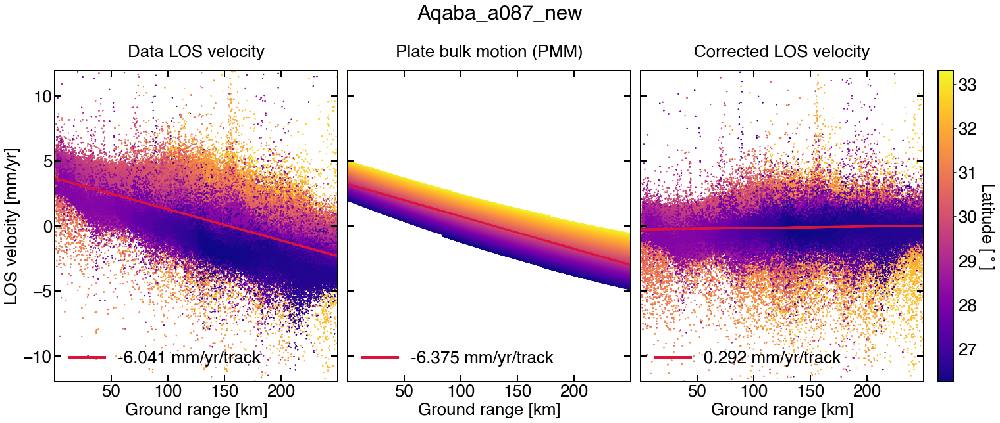


----- 71.40 seconds ----- plotted range ramps

only show one common colorbar in the first subplot
Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/ykliu/aqaba/topsStack/a087/mintpy/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -8 8 --mask no --dem /marmot-nobak/ykliu/aqaba/broad_dem_new/dem_resamp_a087/a087.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot data no. 2: <LOS Plate bulk motion>
view.py /marmot-nobak/ykliu/aqaba/topsStack/a087/mintpy/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -8 8 --mask no --dem /marmot-nobak/ykliu/aqaba/broad_dem_new/dem_resamp_a087/a087.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot d

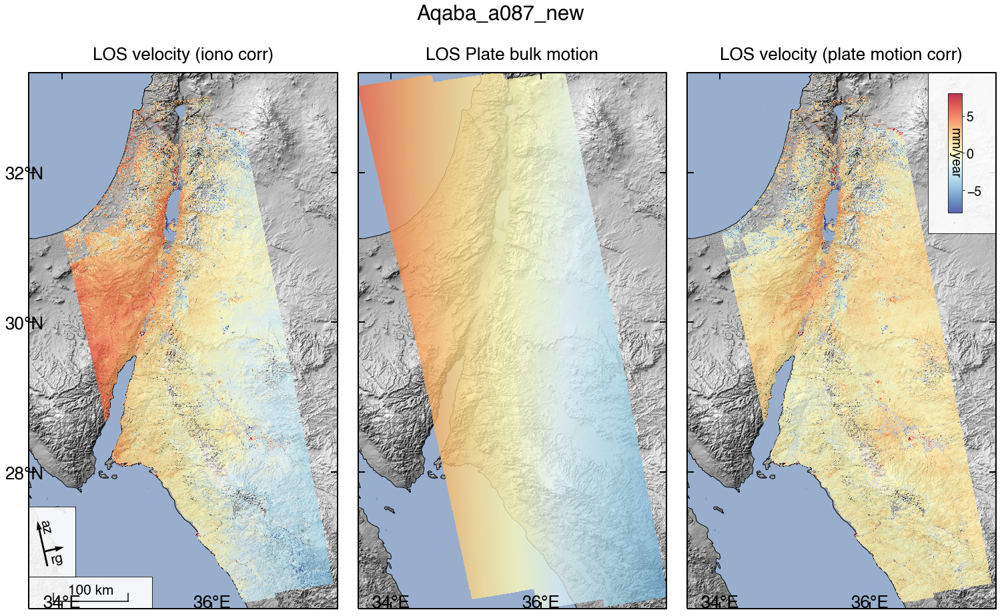


----- 11.98 seconds ----- plotted pmm correction


----- 1.10 seconds ----- saved .h5 files


===== 97.43 seconds ===== total time elapsed



In [6]:
omega_cart = [1.154, -0.136, 1.444]

dName = 'Aqaba a087_new'
pName = 'Arabia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 14,
            'plot_pmm'     : False,
            'plot_ins'     : False,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,          
            'vlim_i'       : [[-10,10],[-10,10],[-2,2]],
            'vlim_r'       : [-12,12],
            'vlim_b'       : [-8,8],
            'refpoint'     : False,
            'shadeExg'     : 0.07,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdYlBu_r',
            'dpi'          : 100,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)

## Dataset: Aqaba descending track 021

+ Processing: already with ERA5, SET, ionosphere, demErr corrections applied

+ Make sure to use the plate motion model from papers, replace the `pmm` variable to reflect the plate motion model name

+ Use the corresponding plate name to plot the plate boundary geoemtry and arrows on it


----- 0.00 seconds ----- start timing

Analyze the data from:  Aqaba d021
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/ykliu/aqaba/topsStack/d021/mintpy/inputs/geometryGeo.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Arabia

Cartesian rotation vector:
 wx:            1.1540 mas / yr
 wy:            -0.1360 mas / yr
 wz:            1.4440 mas / yr

Euler pole representation:
 Latitude:      51.1764 deg
 Longitude:     353.2786 deg
 Rotation rate: 0.5149 deg / Ma  

2D array locations

----- 15.42 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.08 seconds ----- got the model LOS velocity grid

No reference point, remove a median from each dataset!!
Reference data: <LOS velocity (no iono corr)>  	 shifted by -0.02742341160774231
Reference data: <LOS velocity (iono corr)>     	 shifted by 0.60

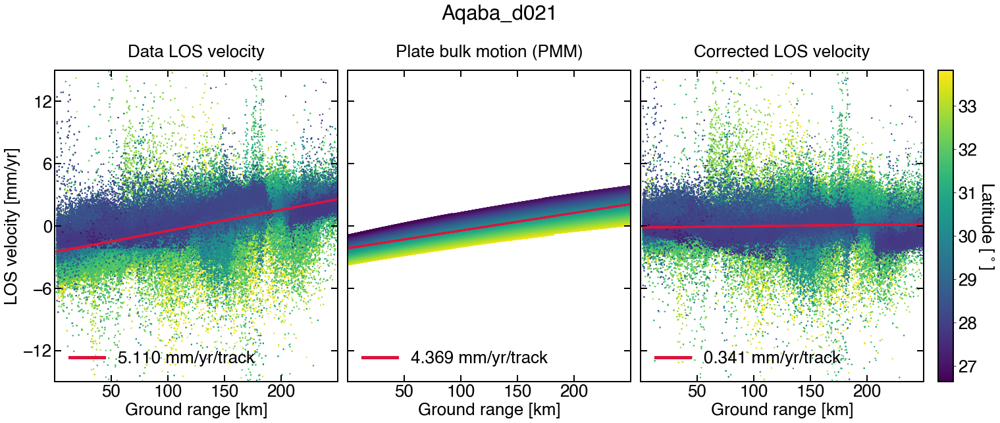


----- 79.87 seconds ----- plotted range ramps

only show one common colorbar in the first subplot
Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/ykliu/aqaba/topsStack/d021/mintpy/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -6 6 --mask no --dem /marmot-nobak/ykliu/aqaba/broad_dem_new/dem_resamp_d021/d021.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot data no. 2: <LOS Plate bulk motion>
view.py /marmot-nobak/ykliu/aqaba/topsStack/d021/mintpy/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -6 6 --mask no --dem /marmot-nobak/ykliu/aqaba/broad_dem_new/dem_resamp_d021/d021.dem --dem-nocontour -c RdYlBu_r --nocbar --alpha 0.78 --shade-exag 0.07 --shade-min -3000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --noreference
Plot d

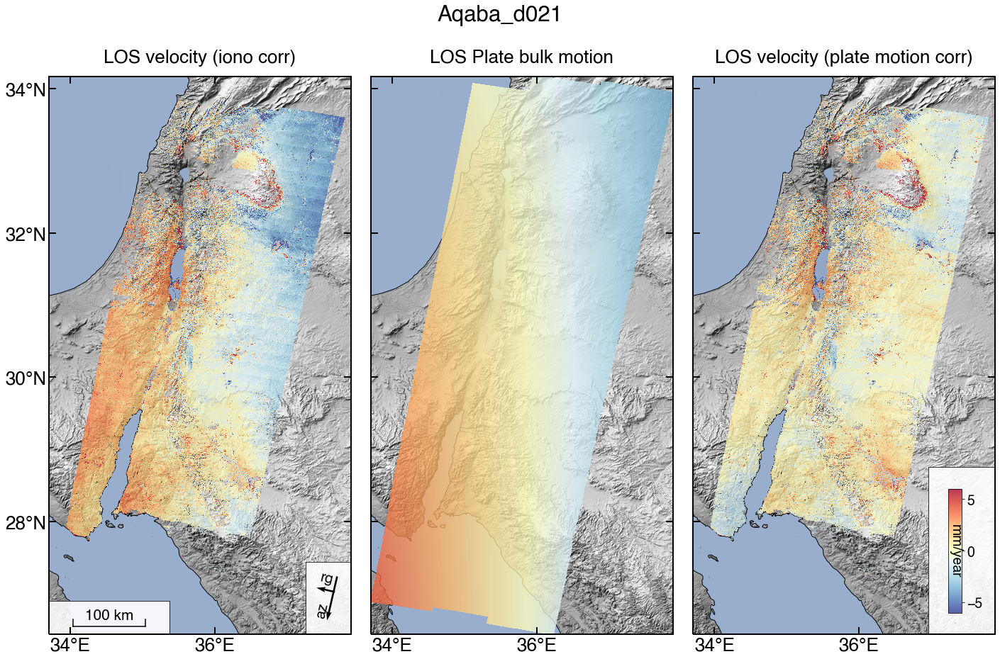


----- 12.03 seconds ----- plotted pmm correction


----- 0.13 seconds ----- saved .h5 files


===== 109.28 seconds ===== total time elapsed



In [4]:
omega_cart = [1.154, -0.136, 1.444]

dName = 'Aqaba d021'
pName = 'Arabia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 14,
            'plot_pmm'     : False,
            'plot_ins'     : False,
            'plot_rmp'     : True,
            'plot_ion'     : False,
            'plot_maj'     : True,          
            'vlim_i'       : [[-6, 6],[-6,6],[-1.5,1.5]],
            'vlim_r'       : [-15,15],
            'vlim_b'       : [-6,6],
            'refpoint'     : False,
            'shadeExg'     : 0.07,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdYlBu_r',
            'dpi'          : 100,          
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)

# Check the effect of heading and incidence angle on the ramp curvature

Which angle have teh dominant effect on the curvature of the range ramp?

Ans. The "incidence" angle is the major factor!



Also, notice that:

+ Ascending: (as range increases)
    - negative slope, positive curvature
    - LOS velocity varies as -V * sin(inc)



+ Descending: (as range increases)
    - positive slope, negative curvature
    - LOS velocity varies as +V * sin(inc)


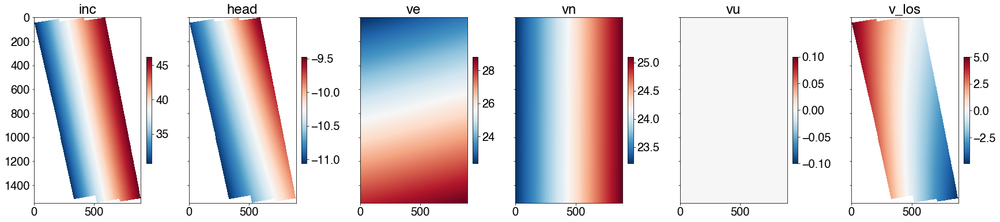

Min. LOS motion = -4.941
Max. LOS motion = 5.036
Dynamic range of LOS motion = 9.977
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 255.4 km


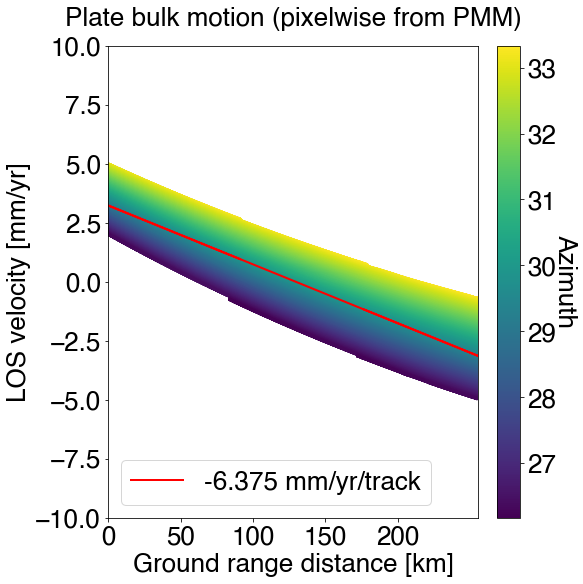

Using pixel-wise ENU velocity input


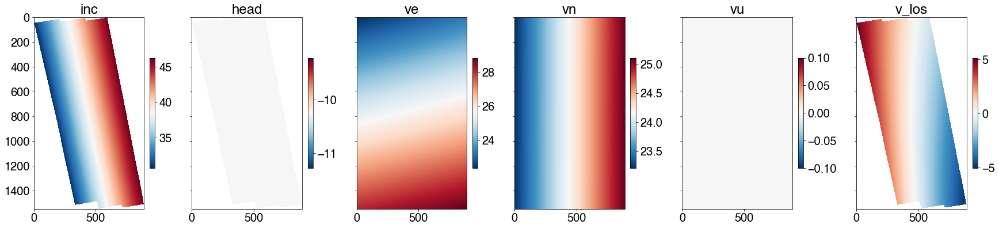

Min. LOS motion = -5.048
Max. LOS motion = 5.135
Dynamic range of LOS motion = 10.182
Range ramp scatter plot shifted by median -1.7763568394002505e-15
Ground range distance spans 255.4 km


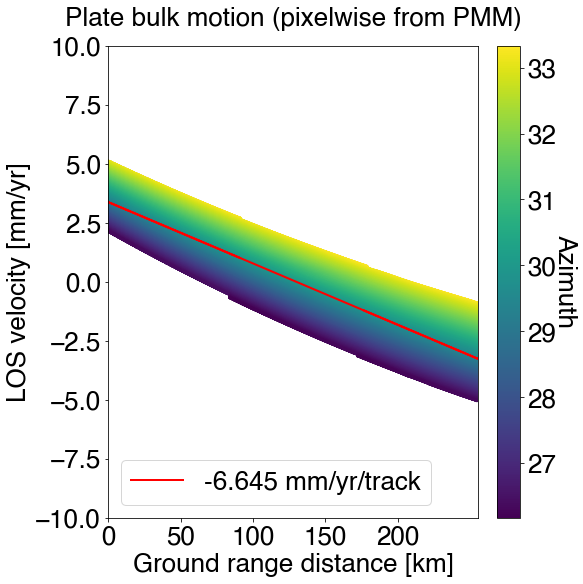

Using pixel-wise ENU velocity input


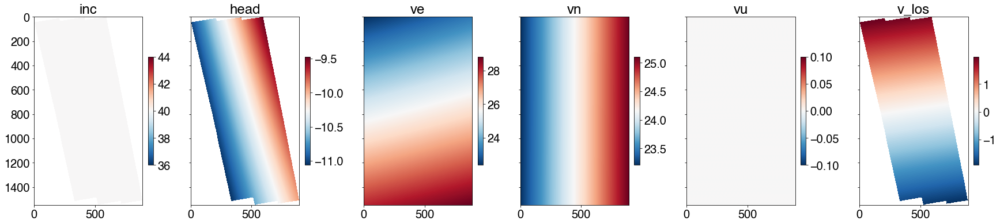

Min. LOS motion = -1.921
Max. LOS motion = 1.987
Dynamic range of LOS motion = 3.908
Range ramp scatter plot shifted by median -1.7763568394002505e-15
Ground range distance spans 255.4 km


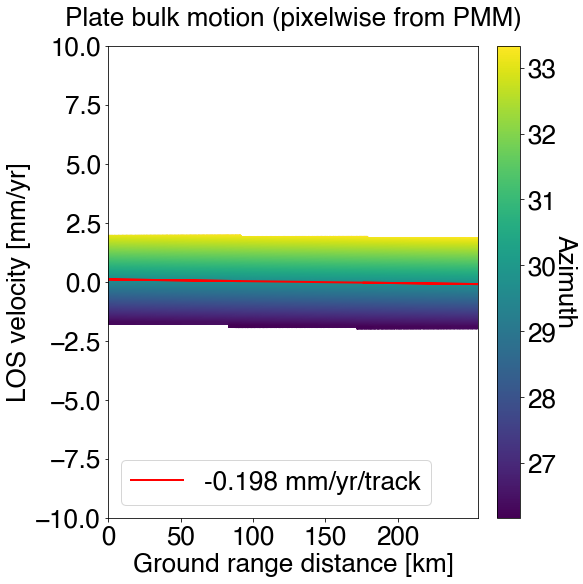

Using pixel-wise ENU velocity input


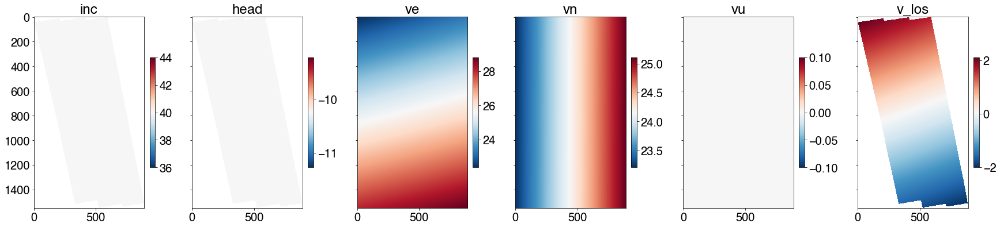

Min. LOS motion = -2.016
Max. LOS motion = 2.109
Dynamic range of LOS motion = 4.124
Range ramp scatter plot shifted by median -1.7763568394002505e-15
Ground range distance spans 255.4 km


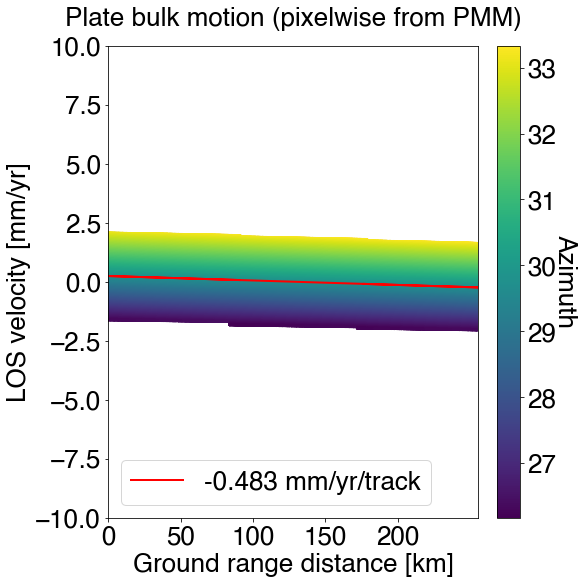

-0.0018927117509794748

In [5]:
import copy
# What is causing the profile curvature? Heading? or Incidence?


# varying heading angle (from the data geometry file)
geom_a087 = copy.deepcopy(all_class['Aqaba a087'])
geom_a087.plot_inputs(ref=True)
geom_a087.plot_ramp(track='vary heading & incidence', vlim=[-10,10])


# a fixed heading (assumed to be an average)
geom_a087.head_deg[~np.isnan(geom_a087.head_deg)] = -10.25
geom_a087.enu2los(V=geom_a087.V_pmm_enu)
geom_a087.plot_inputs(ref=True)
geom_a087.plot_ramp(track='fix heading', vlim=[-10,10])


# a fixed incidence (assumed to be an average)
geom_a087 = copy.deepcopy(all_class['Aqaba a087'])
geom_a087.inc_deg[~np.isnan(geom_a087.inc_deg)] = 40
geom_a087.enu2los(V=geom_a087.V_pmm_enu)
geom_a087.plot_inputs(ref=True)
geom_a087.plot_ramp(track='fix incidence', vlim=[-10,10])


# a fixed incidence (assumed to be an average)
geom_a087 = copy.deepcopy(all_class['Aqaba a087'])
geom_a087.head_deg[~np.isnan(geom_a087.head_deg)] = -10.25
geom_a087.inc_deg[~np.isnan(geom_a087.inc_deg)] = 40
geom_a087.enu2los(V=geom_a087.V_pmm_enu)
geom_a087.plot_inputs(ref=True)
geom_a087.plot_ramp(track='fix both', vlim=[-10,10])
